## Ninjacart- Computer Vision Classification
**Problem Statement: Multiclass classifier that can distinguish between images of different types
of vegetables, while also correctly labeling images that do not contain any one
type of vegetable as noise becomes critical.**

### This dataset contains a 2 folder train and test, which has a total of 3135 images, split into four folders as follows:

`Tomato : 789`

`Potato : 898`

`Onion : 849`

`Indian market : 599`

### Another folder test which has a total of 351 images, split into four folders

`Tomato : 106`

`potato : 83`

`onion : 81`

`Indian market : 81`

- Here in this dataset Indian market images are feed as `noise`

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import random
import os
import glob
import tensorflow as tf
from tensorflow import keras # this allows <keras.> instead of <tf.keras.>
from tensorflow.keras import layers # this allows <layers.> instead of <tf.keras.layers.>
tf.keras.utils.set_random_seed(111) # set random seed

# To supress any warnings during the flow
import warnings
warnings.filterwarnings('ignore')

plt.rcParams.update({'font.size': 14})

In [ ]:
!gdown https://drive.google.com/uc?id=1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT

Downloading...
From (original): https://drive.google.com/uc?id=1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT
From (redirected): https://drive.google.com/uc?id=1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT&confirm=t&uuid=e0ac5d60-4899-4334-ac7c-901a92661f81
To: /content/ninjacart_data.zip
100% 275M/275M [00:02<00:00, 103MB/s] 


In [ ]:
!unzip /content/ninjacart_data.zip

Archive:  /content/ninjacart_data.zip
   creating: ninjacart_data/test/
   creating: ninjacart_data/test/indian market/
  inflating: ninjacart_data/test/indian market/bhl.jpeg  
  inflating: ninjacart_data/test/indian market/bhv.jpeg  
  inflating: ninjacart_data/test/indian market/bn.jpeg  
  inflating: ninjacart_data/test/indian market/hjx.jpeg  
  inflating: ninjacart_data/test/indian market/igis.jpeg  
  inflating: ninjacart_data/test/indian market/in.jpeg  
  inflating: ninjacart_data/test/indian market/india-4898453__340.jpg  
  inflating: ninjacart_data/test/indian market/indianmarket10.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket12.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket13.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket14.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket15.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket18.jpeg  
  inflating: ninjacart_data/test/indian market/

In [ ]:
# function to load folders inside ninjacart_data.
def file_load(file_name):
    class_dirs = os.listdir(f"ninjacart_data/{file_name}/")
    image_dict = {} # dict to store image array(key) for every class(value)
    count_dict = {} # dict to store count of files(key) for every class(value)
    # iterate over all class_dirs
    for cls in class_dirs:
        # get list of all paths inside the subdirectory
        file_paths = glob.glob(f'ninjacart_data/{file_name}/{cls}/*')
        # count number of files in each class and add it to count_dict
        count_dict[cls] = len(file_paths)
        # select random item from list of image paths
        image_path = random.choice(file_paths)
        # load image using keras utility function and save it in image_dict
        image_dict[cls] = tf.keras.utils.load_img(image_path)
    return image_dict, count_dict

In [ ]:
train_file= file_load("train")
train_file[1]

{'indian market': 599, 'potato': 898, 'onion': 849, 'tomato': 789}

In [ ]:
test_file= file_load("test")
test_file[1]

{'indian market': 81, 'potato': 81, 'onion': 83, 'tomato': 106}

- **With above info we can validate that provided count of images and in dataset are same.**

In [ ]:
## Viz Random Sample from each class

def img_plot(x):
    plt.figure(figsize=(20, 15))
    # iterate over dictionary items (class label, image array)
    for i, (cls,img) in enumerate(x[0].items()):
        # create a subplot axis
        ax = plt.subplot(3, 4, i + 1)
        # plot each image
        pt= plt.imshow(img)
        # set "class name" along with "image size" as title
        plt.title(f'{cls}, {img.size}')
        plt.axis("off")
    return pt

### Random images from train folder

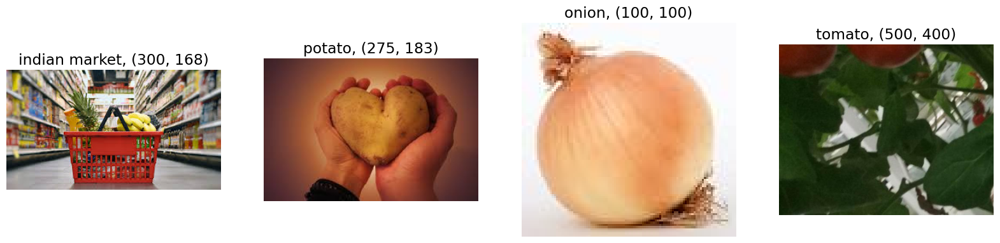

In [ ]:
img_plot(train_file)

### Random images from test folder

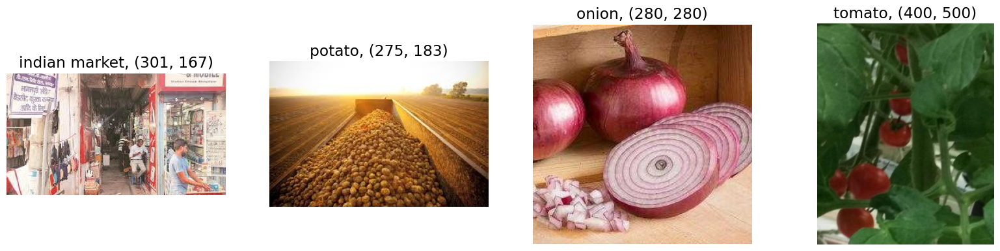

In [ ]:
img_plot(test_file)

- As we can see Images are of different sizes
- In tomato class images we can see leafs with some part of tomato, in this way model will be able to generalize well.

In [ ]:
df_train_dict_count= pd.DataFrame(
                {
                   "class_name" : train_file[1].keys(),
                    "count" : train_file[1].values()
                }
                 )

In [ ]:
df_train_dict_count

,class_name,count
0,indian market,599
1,potato,898
2,onion,849
3,tomato,789


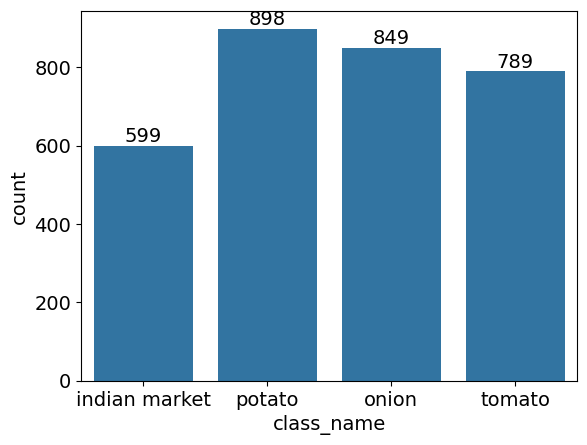

In [ ]:
## plotting distribution of classes in training dataset

lbl= sns.barplot(data= df_train_dict_count, x="class_name", y= "count")
for i in lbl.containers:
    lbl.bar_label(i)


In [ ]:
df_test_dict_count= pd.DataFrame(
                {
                   "class_name" : test_file[1].keys(),
                    "count" : test_file[1].values()
                }
                 )

In [ ]:
df_test_dict_count

,class_name,count
0,indian market,81
1,potato,81
2,onion,83
3,tomato,106


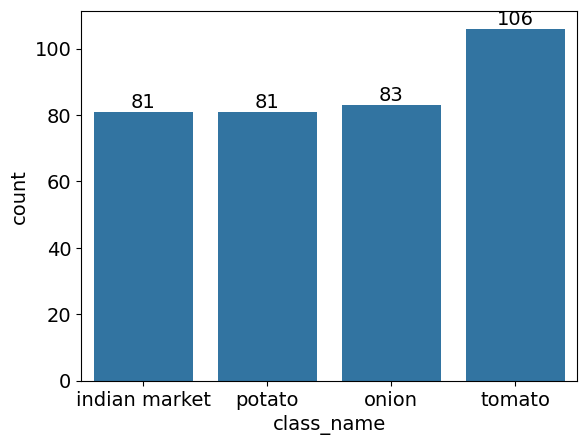

In [ ]:
## plotting distribution of classes in test dataset

lbl= sns.barplot(data= df_test_dict_count, x="class_name", y= "count")
for i in lbl.containers:
    lbl.bar_label(i)


### Splitting Dataset into train, Validation and test.

   - Using `tf.keras.utils.image_dataset_from_directory`.
   - It will label image in one hot encoding

- **Resizing all images to 256 X 256**

In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(directory = "ninjacart_data/train",
                                                       label_mode = 'categorical',
                                                       batch_size = 32,
                                                       image_size = (256, 256),
                                                       seed = 2022,
                                                       validation_split = 0.2,
                                                       subset = "training",
                                                       shuffle=True)

Found 3135 files belonging to 4 classes.
Using 2508 files for training.


- Since, label_mode = 'categorical' so one hot encode the classes the alphabetically.

In [ ]:
test_ds = tf.keras.utils.image_dataset_from_directory(directory = "ninjacart_data/test",
                                                       label_mode = 'categorical',
                                                       batch_size = 32,
                                                       image_size = (256, 256),
                                                       seed = 2022)

Found 351 files belonging to 4 classes.


### Creating 20% validation data

In [ ]:
valid_ds = tf.keras.utils.image_dataset_from_directory(directory = "ninjacart_data/train",
                                                       label_mode = 'categorical',
                                                       batch_size = 32,
                                                       image_size = (256, 256),
                                                       seed = 2022,
                                                       validation_split = 0.2,
                                                       subset = "validation")

Found 3135 files belonging to 4 classes.
Using 627 files for validation.


## Custom CNN model

- building a baseline CNN Architecture with some Convolutional blocks and MaxPooling

In [ ]:
image_size= (256,256)

In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.Rescaling(1./255, input_shape=(image_size[0], image_size[1], 3)),
#     tf.keras.layers.InputLayer(input_shape = [image_size[0], image_size[1], 3]),

    tf.keras.layers.Conv2D(filters = 32, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
    tf.keras.layers.Conv2D(filters = 32, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
    tf.keras.layers.MaxPool2D(pool_size = (2,2)),

    tf.keras.layers.Conv2D(filters = 64, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
    tf.keras.layers.Conv2D(filters = 64, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
    tf.keras.layers.MaxPool2D(pool_size = (2,2)),

    tf.keras.layers.Conv2D(filters = 128, kernel_size = (3,3), padding = 'Same', activation = 'relu'),

    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(4, activation = 'softmax')
    ])

In [ ]:
model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-4),
              loss = tf.keras.losses.CategoricalCrossentropy(),
              metrics = ['accuracy', 'Precision', 'Recall'])

In [ ]:
log_dir_1 = "logs/Custom_CNN_overfit"
tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir=log_dir_1, histogram_freq=1)

In [ ]:
history = model.fit(train_ds, epochs=30, validation_data=valid_ds, callbacks=[tensorboard_cb])

Epoch 1/30
79/79 [==============================] - 30s 225ms/step - loss: 1.3385 - accuracy: 0.3182 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 1.2603 - val_accuracy: 0.4115 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/30
79/79 [==============================] - 14s 165ms/step - loss: 1.0038 - accuracy: 0.6120 - precision: 0.8449 - recall: 0.2564 - val_loss: 0.7903 - val_accuracy: 0.7081 - val_precision: 0.8591 - val_recall: 0.4960
Epoch 3/30
79/79 [==============================] - 14s 162ms/step - loss: 0.7297 - accuracy: 0.7237 - precision: 0.8198 - recall: 0.6005 - val_loss: 0.7567 - val_accuracy: 0.6826 - val_precision: 0.7505 - val_recall: 0.5997
Epoch 4/30
79/79 [==============================] - 14s 171ms/step - loss: 0.6763 - accuracy: 0.7472 - precision: 0.8082 - recall: 0.6535 - val_loss: 0.7024 - val_accuracy: 0.7289 - val_precision: 0.8133 - val_recall: 0.6459
Epoch 5/30
79/79 [==============================] - 14s 171ms/step - loss: 0.6529 - 

In [ ]:
def matrix_plot(model_history, n_epochs):
    sns.set(style="whitegrid")

    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
    ax = axes.ravel()

    # accuracy graph
    sns.lineplot(x=range(0, n_epochs), y=[acc * 100 for acc in model_history.history['accuracy']], ax=ax[0], label='Train', color='b')
    sns.lineplot(x=range(0, n_epochs), y=[acc * 100 for acc in model_history.history['val_accuracy']], ax=ax[0], label='Val', color='r')
    ax[0].set_title('Accuracy vs. Epoch', fontsize=15)
    ax[0].set_ylabel('Accuracy (%)', fontsize=15)
    ax[0].set_xlabel('Epoch', fontsize=15)
    ax[0].legend()

    # loss graph
    sns.lineplot(x=range(0, n_epochs), y=model_history.history['loss'], ax=ax[1], label='Train', color='b')
    sns.lineplot(x=range(0, n_epochs), y=model_history.history['val_loss'], ax=ax[1], label='Val', color='r')
    ax[1].set_title('Loss vs. Epoch', fontsize=15)
    ax[1].set_ylabel('Loss', fontsize=15)
    ax[1].set_xlabel('Epoch', fontsize=15)
    ax[1].legend()

    # display the graph
    plt.tight_layout()
    plt.show()


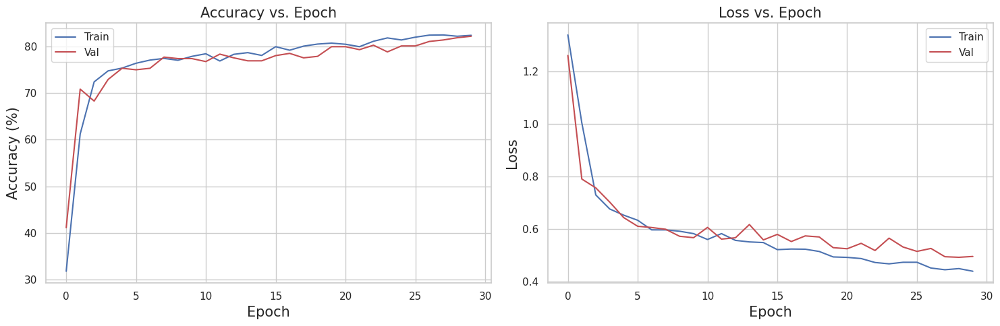

In [ ]:
matrix_plot(history, n_epochs = 30)

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 256, 256, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 32)      896       
                                                                 
 conv2d_1 (Conv2D)           (None, 256, 256, 32)      9248      
                                                                 
 max_pooling2d (MaxPooling2  (None, 128, 128, 32)      0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 128, 128, 64)      18496     
                                                                 
 conv2d_3 (Conv2D)           (None, 128, 128, 64)      36928     
                                                        

### Testing the model on random sample.

In [ ]:
test_dir= "ninjacart_data/test/"
class_names= ['noise', 'onion', 'potato', 'tomato']

In [ ]:
# List all test images
test_images = [os.path.join(test_dir, folder, image)
               for folder in os.listdir(test_dir)
               for image in os.listdir(os.path.join(test_dir, folder))]



In [ ]:
test_images[:5]

['ninjacart_data/test/indian market/indianmarket30.jpeg',
 'ninjacart_data/test/indian market/indianmarket46.jpeg',
 'ninjacart_data/test/indian market/indianmarket52.jpeg',
 'ninjacart_data/test/indian market/indianmarket4.jpeg',
 'ninjacart_data/test/indian market/indianmarket34.jpeg']

In [ ]:

# Function to test the model
def model_tester(model):
    sns.set(style="whitegrid")

    fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(17, 11))
    plt.subplots_adjust(wspace=0.5, hspace=0.5)
    axes = axes.ravel()

    for i in range(8):
        img_path = random.choice(test_images)
        img = tf.keras.utils.load_img(img_path, target_size=(256, 256))
        img_array = tf.keras.utils.img_to_array(img)
        img_array = tf.expand_dims(img_array, axis=0)

        pred = model.predict(img_array)
        predicted_label = tf.argmax(pred, axis=1).numpy().item()
        pred_percentages = [tf.round(item * 100).numpy().item() for item in pred[0]]

        axes[i].imshow(img_array[0] / 255.0)
        axes[i].set_title(f'Prediction: {class_names[predicted_label]}\n\n'
                          f'{pred_percentages[0]}% {class_names[0]}\n'
                          f'{pred_percentages[1]}% {class_names[1]}\n'
                          f'{pred_percentages[2]}% {class_names[2]}\n'
                          f'{pred_percentages[3]}% {class_names[3]}')
        axes[i].axis('off')

    plt.show()

1/1 [==============================] - 0s 19ms/step


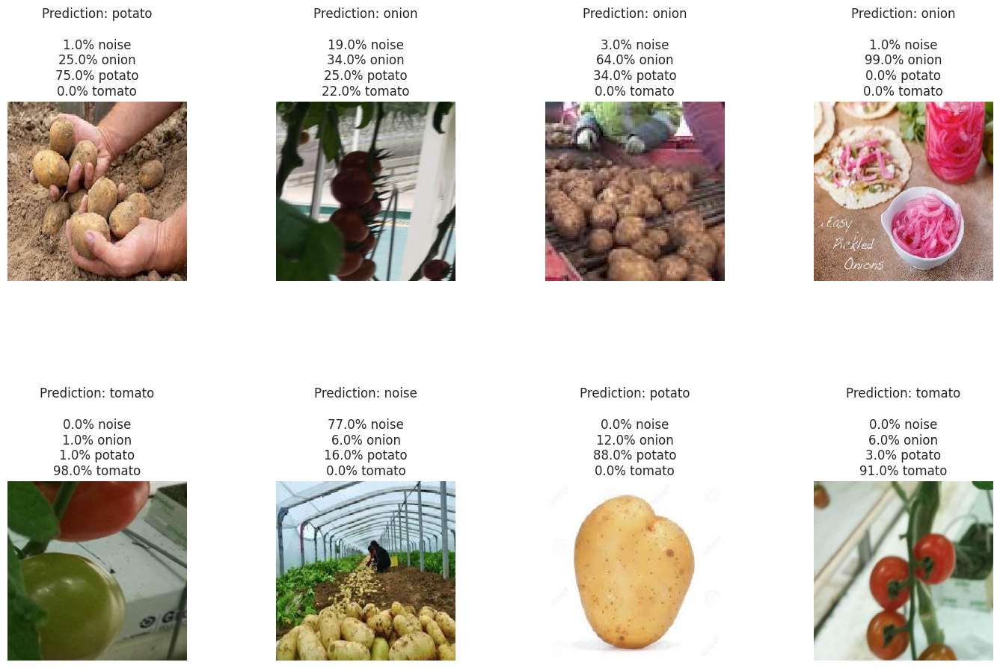

In [ ]:
model_tester(model)

- As we can see model sometime not able to distinguish between onion and noise.
- It also somewhat got confuse with potato and noise.
- One good thing is that model able to identify tomato in different position of images, even if tomato is slightly hidden behind leaves.
- Need to work on its confidence.


<br>

**To get better understanding of each class prediction accuracy we will use all test images**

In [ ]:
noise_test_path = 'ninjacart_data/test/indian market'
onion_test_path = 'ninjacart_data/test/onion'
potato_test_path = 'ninjacart_data/test/potato'
tomato_test_path = 'ninjacart_data/test/tomato'

In [ ]:
def classwise_accuracy(class_path, class_name, model):
    image_paths = [os.path.join(class_path, img) for img in os.listdir(class_path)]

    correct_predictions = 0
    total_images = len(image_paths)

    for img_path in image_paths:
        img = tf.keras.utils.load_img(img_path, target_size=(256, 256))
        img_array = tf.keras.utils.img_to_array(img)
        img_array = tf.expand_dims(img_array, axis=0)

        prediction = model.predict(img_array, verbose= False)
        predicted_class = tf.argmax(prediction[0]).numpy()

        if predicted_class == class_names.index(class_name):
            correct_predictions += 1

    accuracy = (correct_predictions / total_images) * 100
    print(f"Accuracy for class {class_name} is {round(accuracy, 2)}% consisting of {total_images} images")

In [ ]:
classwise_accuracy(noise_test_path, 'noise', model)
classwise_accuracy(onion_test_path, 'onion', model)
classwise_accuracy(potato_test_path, 'potato', model)
classwise_accuracy(tomato_test_path, 'tomato', model)

Accuracy for class noise is 62.96% consisting of 81 images
Accuracy for class onion is 75.9% consisting of 83 images
Accuracy for class potato is 54.32% consisting of 81 images
Accuracy for class tomato is 95.28% consisting of 106 images


### Confusion matrix for Custom Model using test_ds

In [ ]:
noise, tomato, potato, onion = 0, 0, 0, 0

l1 = []
l2 = []
l3 = []
l4 = []

In [ ]:
sns.set(rc={'figure.figsize':(11.7, 8.27)})
sns.set(font_scale=1.2)

In [ ]:
def conf_mat(class_path, pred_list, model_name) :
    noise, tomato, potato, onion = 0, 0, 0, 0
    for i in os.listdir(class_path):

        img = tf.keras.utils.load_img(class_path + "/" + str(i))
        img = tf.keras.utils.img_to_array(img)
        img = tf.image.resize(img, (256, 256))
        img = tf.expand_dims(img, axis = 0)

        pred = model_name.predict(img, verbose= False)
        predicted = tf.argmax(pred, 1).numpy().item()

        if predicted == 0:
            noise+= 1
        elif predicted == 1:
            onion+= 1
        elif predicted == 2:
            potato+= 1
        else:
            tomato+= 1


    for item in noise, onion, potato, tomato :
        pred_list.append(item)

In [ ]:
conf_mat(noise_test_path, l1, model)
conf_mat(onion_test_path, l2, model)
conf_mat(potato_test_path, l3, model)
conf_mat(tomato_test_path, l4, model)

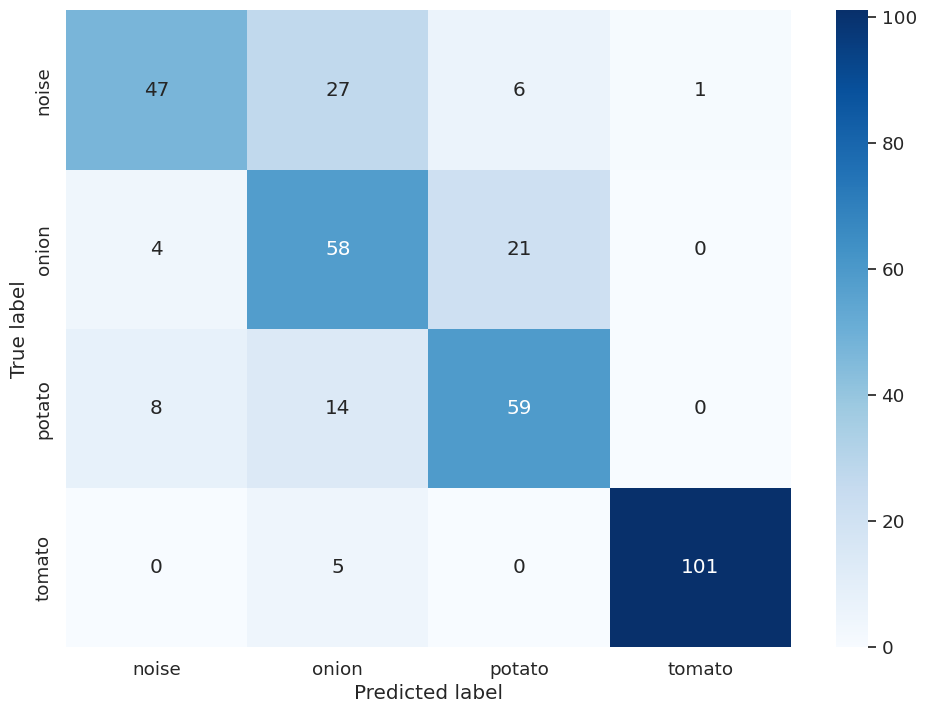

In [ ]:
ax = sns.heatmap([l1, l2, l3, l4], xticklabels=class_names, yticklabels=class_names, cmap='Blues',annot=True, fmt='g')
ax.set(xlabel='Predicted label', ylabel='True label')
plt.show()

In [ ]:
result = model.evaluate(test_ds)

11/11 [==============================] - 4s 277ms/step - loss: 0.5271 - accuracy: 0.7607 - precision: 0.8069 - recall: 0.7379


- As we can see loss is 0.5551, which indicating there is room for improvement.
- To improve the performance of model we can use other techniques, starting with Data Augmentation

### Data Augmentation
   - Applying 3 type of data augmentation `random flip`, `radom rotation`, `random translation`.
   
  - Then applying dropout and batch normalization to improve its generalization.

In [ ]:
augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomTranslation(height_factor = 0.2, width_factor=0.2)
])

aug_ds = train_ds

# Applying Augmenttation on each image of train dataset.
for image, label in aug_ds :
  image = augmentation(image)

### Building custom model with `Batch Normalization` and `Dropouts`

In [ ]:
model_revamp = tf.keras.Sequential([

                tf.keras.layers.Rescaling(1./255, input_shape=(image_size[0], image_size[1], 3)),
#            tf.keras.layers.InputLayer(input_shape = [image_size[0], image_size[1], 3]),

                tf.keras.layers.Conv2D(filters = 32, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
                tf.keras.layers.Conv2D(filters = 32, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
                tf.keras.layers.BatchNormalization(),
                tf.keras.layers.MaxPool2D(pool_size = (2,2)),

                tf.keras.layers.Conv2D(filters = 64, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
                tf.keras.layers.Conv2D(filters = 64, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
                tf.keras.layers.BatchNormalization(),
                tf.keras.layers.MaxPool2D(pool_size = (2,2)),

                tf.keras.layers.Conv2D(filters = 128, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
                tf.keras.layers.BatchNormalization(),
                tf.keras.layers.GlobalAveragePooling2D(),
                tf.keras.layers.Dropout(rate = 0.2),

                tf.keras.layers.Dense(4, activation = 'softmax')
])

In [ ]:
model_revamp.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-4),
                    loss = tf.keras.losses.CategoricalCrossentropy(),
                    metrics = ['accuracy', 'Precision', 'Recall'])

#### Implementing some Callbacks
- `Tensorboard`, `Earlystopping`, `modelcheckpoint`

In [ ]:
log_dir_2 = "logs/Custom_CNN_revamp"

tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir = log_dir_2, histogram_freq = 1)

checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("CNN_best.keras", save_best_only = True)

early_stopping_cb = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_loss', patience = 5, restore_best_weights = True
)

In [ ]:
history_0 = model_revamp.fit(
                               aug_ds,
                               epochs=30,
                               validation_data = valid_ds,
                               callbacks=[tensorboard_cb, checkpoint_cb, early_stopping_cb])

Epoch 1/30
79/79 [==============================] - 20s 194ms/step - loss: 0.7040 - accuracy: 0.7261 - precision: 0.8242 - recall: 0.6224 - val_loss: 1.3883 - val_accuracy: 0.2297 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/30
79/79 [==============================] - 16s 191ms/step - loss: 0.5015 - accuracy: 0.8206 - precision: 0.8651 - recall: 0.7620 - val_loss: 1.4119 - val_accuracy: 0.2297 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 3/30
79/79 [==============================] - 19s 232ms/step - loss: 0.4325 - accuracy: 0.8473 - precision: 0.8812 - recall: 0.8018 - val_loss: 1.3953 - val_accuracy: 0.2297 - val_precision: 1.0000 - val_recall: 0.1244
Epoch 4/30
79/79 [==============================] - 16s 188ms/step - loss: 0.4149 - accuracy: 0.8425 - precision: 0.8760 - recall: 0.8058 - val_loss: 1.4098 - val_accuracy: 0.2408 - val_precision: 0.4147 - val_recall: 0.2249
Epoch 5/30
79/79 [==============================] - 17s 202ms/step - loss: 0.3819 - 

In [ ]:
result = model_revamp.evaluate(test_ds)

11/11 [==============================] - 1s 52ms/step - loss: 0.2931 - accuracy: 0.8946 - precision: 0.9112 - recall: 0.8775


- As we can see there is increase in `accuracy` around 10% after implementing callbacks, dropout layer, and batch normalization layers.


In [ ]:
noise, tomato, potato, onion = 0, 0, 0, 0

l1 = []
l2 = []
l3 = []
l4 = []

In [ ]:
conf_mat(noise_test_path, l1, model_revamp)
conf_mat(onion_test_path, l2, model_revamp)
conf_mat(potato_test_path, l3, model_revamp)
conf_mat(tomato_test_path, l4, model_revamp)

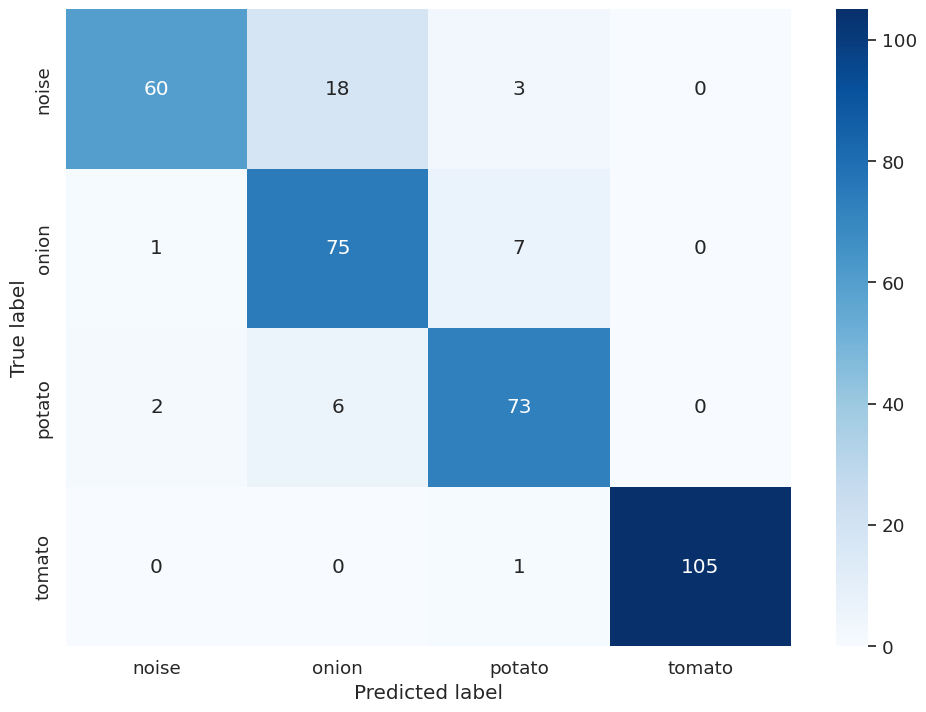

In [ ]:
ax = sns.heatmap([l1, l2, l3, l4], xticklabels=class_names, yticklabels=class_names, cmap='Blues',annot=True, fmt='g')
ax.set(xlabel='Predicted label', ylabel='True label')
plt.show()

- As we can see model_revamp can clearly classify tomato.
- Onion is bit confusing.

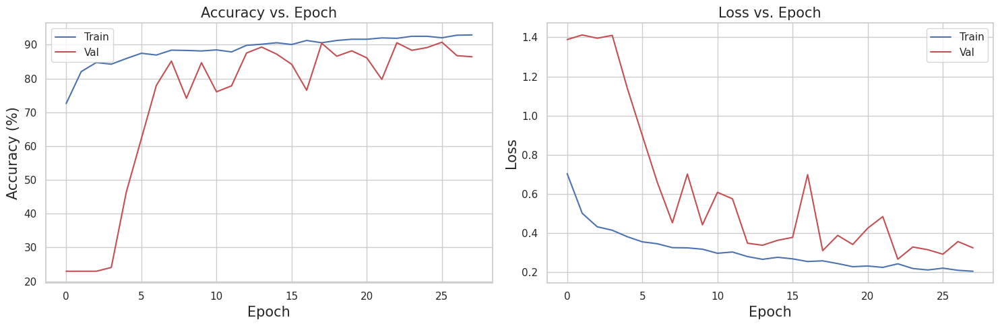

In [ ]:
matrix_plot(history_0, n_epochs=28 )

In [ ]:
classwise_accuracy(noise_test_path, 'noise', model_revamp)
classwise_accuracy(onion_test_path, 'onion', model_revamp)
classwise_accuracy(potato_test_path, 'potato', model_revamp)
classwise_accuracy(tomato_test_path, 'tomato', model_revamp)

Accuracy for class noise is 79.01% consisting of 81 images
Accuracy for class onion is 93.98% consisting of 83 images
Accuracy for class potato is 45.68% consisting of 81 images
Accuracy for class tomato is 99.06% consisting of 106 images


In [ ]:
result = model_revamp.evaluate(test_ds)

11/11 [==============================] - 1s 57ms/step - loss: 0.2931 - accuracy: 0.8946 - precision: 0.9112 - recall: 0.8775


### Transfer Learning

- Using the pretrained weights of popular networks is a great way to do transfer learning, since the size of our original dataset is small.

- Models I will use :
     - ResNet
     - MobileNet

#### ResNet

In [ ]:
# loading base model
base_model_1 = tf.keras.applications.resnet50.ResNet50(input_shape=(256, 256, 3), include_top = False)

94765736/94765736 [==============================] - 1s 0us/step


In [ ]:
trnfr_lrn_model_1 = base_model_1.output

trnfr_lrn_model_1 = tf.keras.Sequential([
            #Normalizing 0-255 into 0 to 1
            tf.keras.layers.Rescaling(1./255, input_shape=(image_size[0], image_size[1], 3)),
            base_model_1,
            tf.keras.layers.GlobalAveragePooling2D(),
            tf.keras.layers.Dropout(rate = 0.1),
            tf.keras.layers.Dense(4, activation = 'softmax')
        ])

In [ ]:
trnfr_lrn_model_1.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-4),
              loss = tf.keras.losses.CategoricalCrossentropy(),
              metrics = ['accuracy', 'Precision', 'Recall'])

In [ ]:
log_dir_3 = "logs/ResNet"

tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir=log_dir_3, histogram_freq=1)

checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("ResNet.keras", save_best_only=True)

early_stopping_cb = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_loss', patience = 5, restore_best_weights=True
)

In [ ]:
history_1 = trnfr_lrn_model_1.fit(aug_ds, validation_data = valid_ds, epochs = 30, callbacks=[tensorboard_cb, checkpoint_cb, early_stopping_cb])

Epoch 1/30
79/79 [==============================] - 90s 643ms/step - loss: 0.1913 - accuracy: 0.9286 - precision: 0.9468 - recall: 0.9151 - val_loss: 13.9695 - val_accuracy: 0.2121 - val_precision: 0.2121 - val_recall: 0.2121
Epoch 2/30
79/79 [==============================] - 44s 544ms/step - loss: 0.0327 - accuracy: 0.9888 - precision: 0.9900 - recall: 0.9864 - val_loss: 3.8676 - val_accuracy: 0.2121 - val_precision: 0.2121 - val_recall: 0.2121
Epoch 3/30
79/79 [==============================] - 44s 552ms/step - loss: 0.0123 - accuracy: 0.9968 - precision: 0.9968 - recall: 0.9968 - val_loss: 2.6557 - val_accuracy: 0.2855 - val_precision: 0.2875 - val_recall: 0.2568
Epoch 4/30
79/79 [==============================] - 42s 524ms/step - loss: 0.0197 - accuracy: 0.9932 - precision: 0.9936 - recall: 0.9928 - val_loss: 3.3408 - val_accuracy: 0.0941 - val_precision: 0.0912 - val_recall: 0.0845
Epoch 5/30
79/79 [==============================] - 44s 550ms/step - loss: 0.0086 - accuracy: 0.998

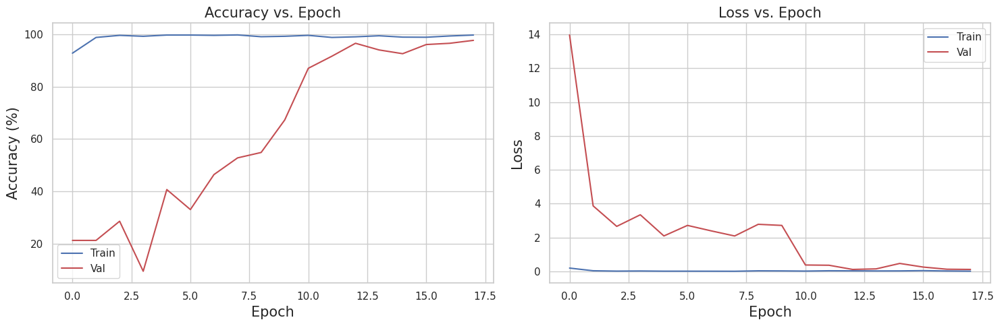

In [ ]:
matrix_plot(history_1, n_epochs = 18)

In [ ]:
classwise_accuracy(noise_test_path, 'noise', trnfr_lrn_model_1)
classwise_accuracy(onion_test_path, 'onion', trnfr_lrn_model_1)
classwise_accuracy(potato_test_path, 'potato', trnfr_lrn_model_1)
classwise_accuracy(tomato_test_path, 'tomato', trnfr_lrn_model_1)

Accuracy for class noise is 95.06% consisting of 81 images
Accuracy for class onion is 92.77% consisting of 83 images
Accuracy for class potato is 88.89% consisting of 81 images
Accuracy for class tomato is 100.0% consisting of 106 images


- As we can see performance has increased, in this model potato prediction accuracy increased significantly.

In [ ]:
l1 = []
l2 = []
l3 = []
l4 = []

In [ ]:
conf_mat(noise_test_path, l1, trnfr_lrn_model_1)
conf_mat(onion_test_path, l2, trnfr_lrn_model_1)
conf_mat(potato_test_path, l3, trnfr_lrn_model_1)
conf_mat(tomato_test_path, l4, trnfr_lrn_model_1)

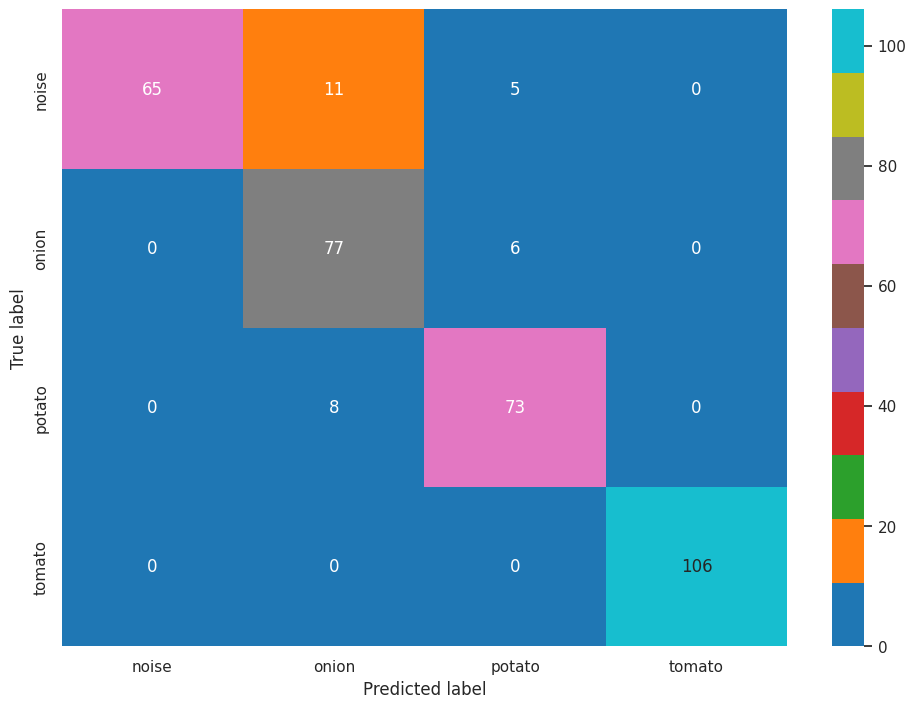

In [ ]:
ax = sns.heatmap([l1, l2, l3, l4], xticklabels=class_names, yticklabels=class_names, cmap='tab10',annot=True, fmt='g')
ax.set(xlabel='Predicted label', ylabel='True label')
plt.show()

In [ ]:
result = trnfr_lrn_model_1.evaluate(test_ds)

11/11 [==============================] - 4s 361ms/step - loss: 0.2201 - accuracy: 0.9117 - precision: 0.9318 - recall: 0.8946


1/1 [==============================] - 0s 22ms/step


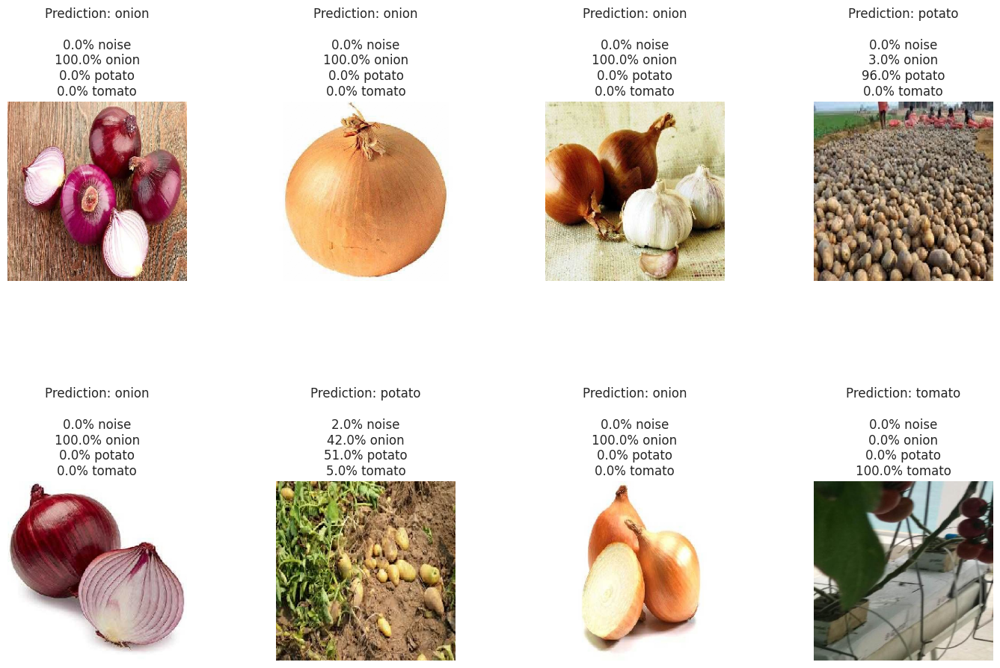

In [ ]:
model_tester(trnfr_lrn_model_1)

- We can see in each image final prediction is correct.

### MobileNet Model

In [ ]:
# loading base MobileNet Model
base_model_2 = tf.keras.applications.mobilenet.MobileNet(input_shape=(256, 256, 3), include_top = False)

17225924/17225924 [==============================] - 0s 0us/step


In [ ]:
mobileNet_trnfr_lrn_model = base_model_2.output

mobileNet_trnfr_lrn_model = tf.keras.Sequential([
            #Normalizing 0-255 into 0 to 1
            tf.keras.layers.Rescaling(1./255, input_shape=(image_size[0], image_size[1], 3)),

            base_model_2,
            tf.keras.layers.GlobalAveragePooling2D(),
            tf.keras.layers.Dropout(rate = 0.1),
            tf.keras.layers.Dense(4, activation = 'softmax')
        ])

In [ ]:
log_dir_4 = "logs/MobileNet"

tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir=log_dir_4, histogram_freq=1)

checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("MobileNet.keras", save_best_only=True)

early_stopping_cb = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_loss', patience = 5, restore_best_weights=True
)

In [ ]:
mobileNet_trnfr_lrn_model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-4),
              loss = tf.keras.losses.CategoricalCrossentropy(),
              metrics = ['accuracy', 'Precision', 'Recall'])

In [ ]:
history_2 = mobileNet_trnfr_lrn_model.fit(aug_ds, validation_data = valid_ds, epochs = 30, callbacks=[tensorboard_cb, checkpoint_cb, early_stopping_cb])

Epoch 1/30
79/79 [==============================] - 20s 243ms/step - loss: 0.2482 - accuracy: 0.9075 - precision: 0.9250 - recall: 0.8947 - val_loss: 0.1233 - val_accuracy: 0.9522 - val_precision: 0.9518 - val_recall: 0.9458
Epoch 2/30
79/79 [==============================] - 16s 198ms/step - loss: 0.0341 - accuracy: 0.9928 - precision: 0.9932 - recall: 0.9912 - val_loss: 0.0904 - val_accuracy: 0.9697 - val_precision: 0.9728 - val_recall: 0.9697
Epoch 3/30
79/79 [==============================] - 17s 200ms/step - loss: 0.0225 - accuracy: 0.9944 - precision: 0.9944 - recall: 0.9940 - val_loss: 0.1052 - val_accuracy: 0.9665 - val_precision: 0.9665 - val_recall: 0.9665
Epoch 4/30
79/79 [==============================] - 16s 191ms/step - loss: 0.0174 - accuracy: 0.9956 - precision: 0.9956 - recall: 0.9948 - val_loss: 0.0998 - val_accuracy: 0.9761 - val_precision: 0.9760 - val_recall: 0.9745
Epoch 5/30
79/79 [==============================] - 18s 210ms/step - loss: 0.0075 - accuracy: 0.9988

In [ ]:
mobileNet_trnfr_lrn_model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_3 (Rescaling)     (None, 256, 256, 3)       0         
                                                                 
 mobilenet_1.00_224 (Functi  (None, 8, 8, 1024)        3228864   
 onal)                                                           
                                                                 
 global_average_pooling2d_3  (None, 1024)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dropout_2 (Dropout)         (None, 1024)              0         
                                                                 
 dense_3 (Dense)             (None, 4)                 4100      
                                                                 
Total params: 3232964 (12.33 MB)
Trainable params: 321

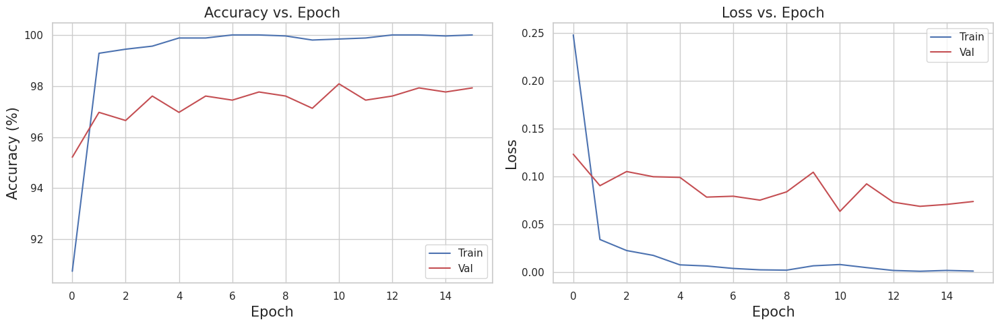

In [ ]:
matrix_plot(history_2, n_epochs=16)

In [ ]:
classwise_accuracy(noise_test_path, 'noise', mobileNet_trnfr_lrn_model)
classwise_accuracy(onion_test_path, 'onion', mobileNet_trnfr_lrn_model)
classwise_accuracy(potato_test_path, 'potato', mobileNet_trnfr_lrn_model)
classwise_accuracy(tomato_test_path, 'tomato', mobileNet_trnfr_lrn_model)

Accuracy for class noise is 86.42% consisting of 81 images
Accuracy for class onion is 100.0% consisting of 83 images
Accuracy for class potato is 69.14% consisting of 81 images
Accuracy for class tomato is 100.0% consisting of 106 images


In [ ]:
l1 = []
l2 = []
l3 = []
l4 = []

conf_mat(noise_test_path, l1, mobileNet_trnfr_lrn_model)
conf_mat(onion_test_path, l2, mobileNet_trnfr_lrn_model)
conf_mat(potato_test_path, l3, mobileNet_trnfr_lrn_model)
conf_mat(tomato_test_path, l4, mobileNet_trnfr_lrn_model)

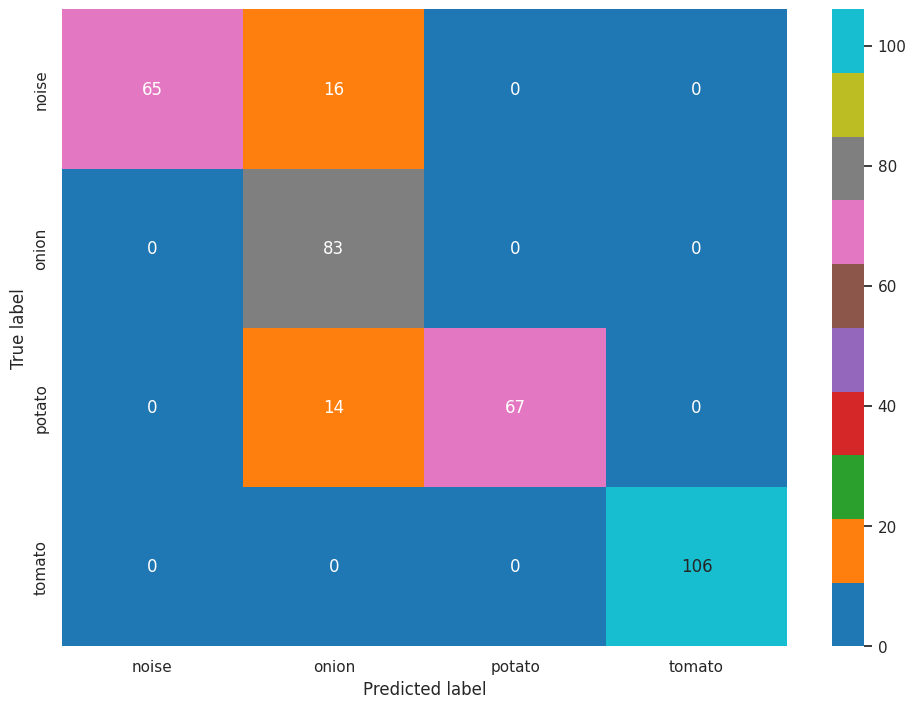

In [ ]:
ax = sns.heatmap([l1, l2, l3, l4], xticklabels=class_names, yticklabels=class_names, cmap='tab10',annot=True, fmt='g')
ax.set(xlabel='Predicted label', ylabel='True label')
plt.show()

In [ ]:
result = mobileNet_trnfr_lrn_model.evaluate(test_ds)

11/11 [==============================] - 2s 160ms/step - loss: 0.4070 - accuracy: 0.9145 - precision: 0.9145 - recall: 0.9145


1/1 [==============================] - 0s 21ms/step


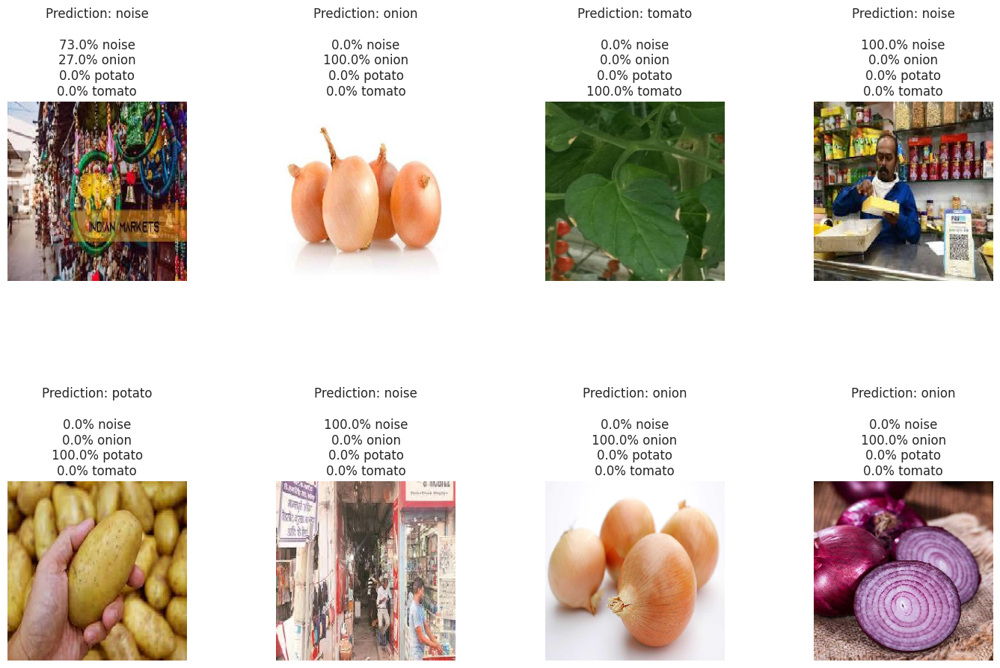

In [ ]:
model_tester(mobileNet_trnfr_lrn_model)

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>


# Summary and Insights from Ninjacart Image Classification Business case.

## Overview
The Business case outline the development and evaluation of several deep learning models for classifying images of vegetables (noise, onion, potato, and tomato) using the Ninjacart dataset. It includes the construction and comparison of custom models, a revamped model, and pre-trained models (ResNet and MobileNet).

## Custom Model
- **Architecture:** Initial custom model using basic layers.
- **Performance:**
  - **Accuracy:**
    - Noise: 62.96%
    - Onion: 75.9%
    - Potato: 54.32%
    - Tomato: 95.28%
  - **Observations:**
    - High accuracy for tomato, poor performance for potato.
    - Model struggled to distinguish between similar-looking classes (onion and noise, potato and noise).

## Revamped Model
- **Enhancements:**
  - **Data Augmentation:** Applied techniques such as random flips, rotations, and translations to increase data variability.
  - **Regularization:** Implemented Dropout and Batch Normalization to improve generalization and prevent overfitting.
  - **Callbacks:** Utilized TensorBoard for visualization, EarlyStopping to prevent overfitting, and ModelCheckpoint to save the best model during training.
- **Performance Improvements:**
  - **Accuracy:**
    - Noise: 79.01%
    - Onion: 93.98%
    - Potato: 45.68%
    - Tomato: 99.06%


  - Significant improvements in Noise class, But for potato have the lowest accuracy.

## ResNet Model
- **Implementation:** Used the ResNet architecture pre-trained on ImageNet.
- **Performance:**
   - **Accuracy:**
    - Noise: 95.06%
    - Onion: 92.77%
    - Potato: 88.89%
    - Tomato: 100%

- Significant improvements across all classes, particularly for potato, which previously had the lowest accuracy.
- Loss Reduction: Initial model had a loss of 0.5271, which improved to 0.2201 after enhancements.


## MobileNet Model
- **Implementation:** Utilized the MobileNet architecture for its efficiency and suitability for mobile applications.
- **Performance:**
  - **Accuracy**
    - noise: 86.42%
    - onion: 100.0%
    - Potato: 69.14%
    - Tomato :100.0%

## Similar-Looking Classes
- **Challenges:**
  - The model had difficulties distinguishing between classes that visually resemble each other, such as:
    - Onion vs. Noise
    - Potato vs. Noise
  - Tomato class consistently achieved high accuracy due to its distinct appearance.
- **Confusion Matrix Insights:** Analysis through confusion matrices indicated that misclassifications were more frequent among the similar-looking classes mentioned above.



<br>

1. Transfer Learning Superiority: Models utilizing transfer learning (ResNet50 and MobileNet) outperformed custom-built models significantly. This highlights the power of using pre-trained networks that have learned extensive features from large datasets.

2. MobileNet’s Efficiency: Despite its lightweight nature, MobileNet provided the highest accuracy and precision, making it an excellent choice for deployment in environments with limited computational resources.

3. Early Stopping and Checkpointing: These techniques were critical in preventing overfitting and ensuring the best-performing model was saved during training.

4. Data Augmentation: Although not explicitly detailed, data augmentation likely played a crucial role in enhancing model robustness and generalization.

5. Class Imbalance Handling: The relatively balanced class distribution facilitated effective learning across all classes, contributing to high performance metrics.